# HoVer-Net Inference Usage

This repository enables the segmentation of nuclei in H&E whole-slide images (WSIs). We provide this notebook to show how the `wsi` and `tile` modes can be used and how to extract and utilise the generated results.  

First, ensure that the environment is set as, as instructed on the [README](https://github.com/simongraham/hovernet_inference/blob/master/README.md).

Modes available:
- `wsi`
- `tile`

In the repository, we supply two trained models: one trained on the PanNuke dataset and one trained on the MoNuSAC dataset.

Each mode generates a `.json` file that contains predicted nuclei centroid, bounding box and centroid coordinate for each instance. The `.json` file also gives the predicted nuclear types and, if requested, the per-type probabilities for each instance. `wsi` mode only generates the `.json` file as it is not feasible to generate per-pixel results at a high resolution. `tile` mode also generates a 2D instance segmentation map, as a `.npy` file, and also generates an overlay of the results on top of the original image, where the colour of the boundary denotes the type of nucleus. 

**Expected input types:**  <br />
`tile`: the input must be in a standard image format, such as `.jpg` or `.png`. <br />
`wsi` : the input must be a whole-slide image. Supported formats include those also supported by [OpenSlide](https://openslide.org/) and `.jp2`.

In this notebook we will:

- Use a selection of H&E image tiles and process with `tile` mode
- Use a single H&E WSI and process with `wsi` mode


In [1]:
import numpy as np
import glob
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
import math
import openslide as ops
import os
import json

from hover.postproc import process_utils as proc_utils
from hover.misc.wsi_handler import get_wsi_handler
from hover.misc.utils import visualize_instances
from run import InferTile, InferWSI # import classes

In [2]:
# configuration that we won't change throughout the notebook
args = {}

args['--gpu'] = '1'                  # GPU list
args['--batch_size'] = 25            # Batch size
args['--inf_tile_shape'] = 10000     # Size of tiles for inference (assumes square shape)
args['--proc_tile_shape'] = 2048     # Size of tiles for inference (assumes square shape)
args['--return_probs'] = True        # Whether to return the per-type instance probabilities

## Tile Processing Mode

In [3]:
# Tile mode

args['--mode'] = 'tile'                 # Inference mode. 'tile' or 'wsi'

In [4]:
# First use HoVer-Net model trained on the PanNuke dataset. The PanNuke dataset consists of the following classes:
# 1) Neoplastic, 2) Inflammatory, 3) Connective, 4) Dead, 5) Non-Neoplastic Epithelial

args['--input_dir'] = 'tile_input_pannuke'      # Directory containing input images
args['--model'] = 'pannuke.npz'                 # Path to saved checkpoint
args['--output_dir'] = 'tile_output_pannuke'    # Directory where the output will be saved

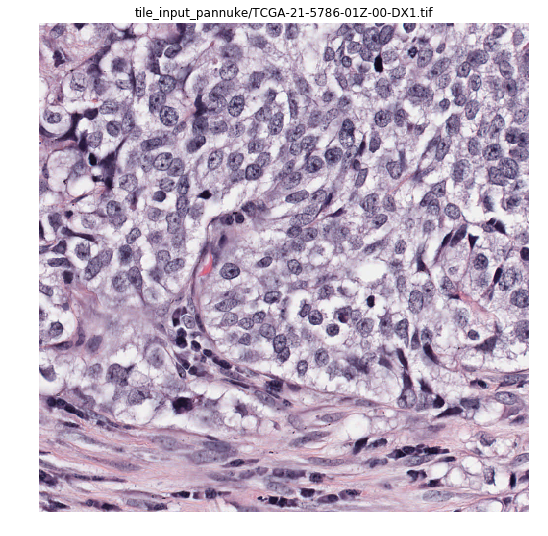

In [5]:
# View an image from the input directory

image_list = glob.glob(args['--input_dir'] + '/*') # get a list of the files in the directory
img = cv2.imread(image_list[0]) # read the first file
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # cv2 reads as BGR -> convert back to RGB

plt.figure(figsize=(9,9))
plt.imshow(img)
plt.axis('off')
plt.title(image_list[0])
plt.show()

### First, process with weights trained on PanNuke Dataset

In [6]:
# Initialise Tile mode and process all image tiles in the input folder

infer_pannuke = InferTile()
infer_pannuke._parse_args(args)
infer_pannuke.load_model()
infer_pannuke.process_all_files()

Loading Model...
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Processing Images: 100%|########################| 14/14 [04:39<00:00,  5.94s/it]


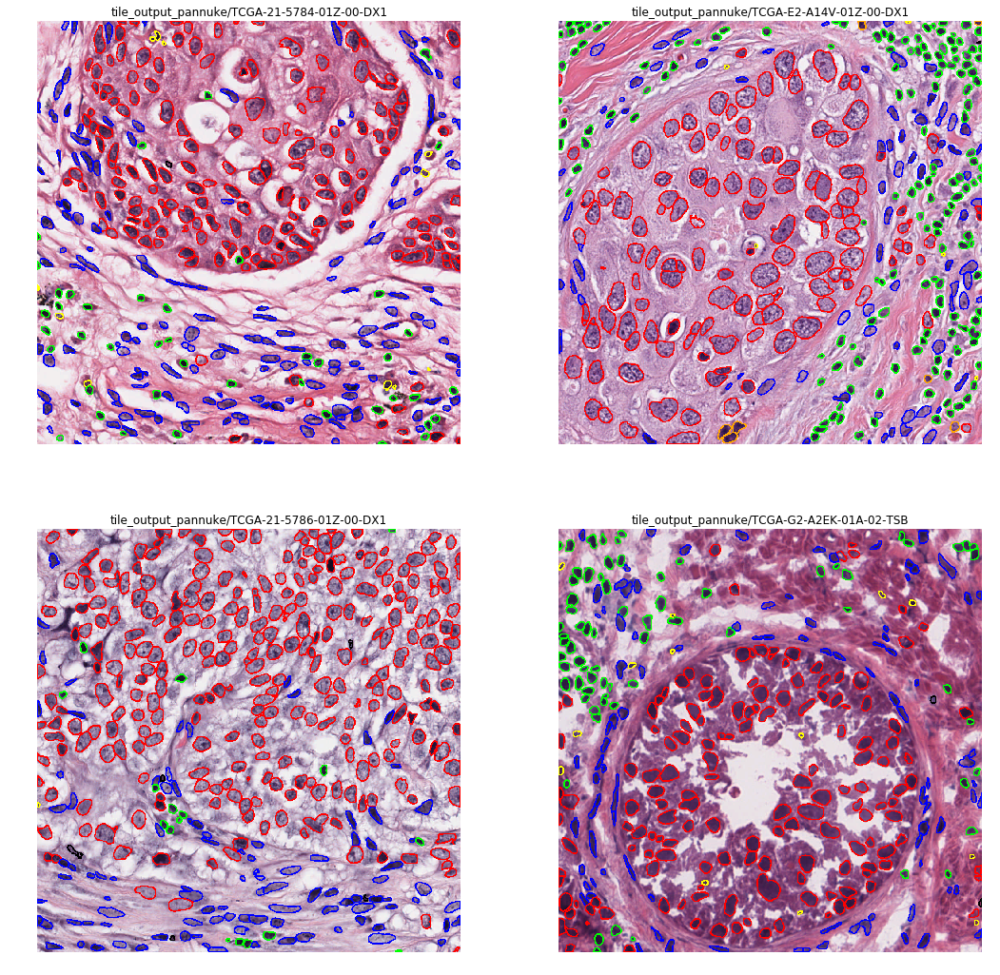

In [8]:
# Visualise the results 

# view overlaid results for a selection of images

output_list_pannuke = glob.glob(args['--output_dir']  + '/*') # get a list of the overlaid results in the output directory

im_numbers = [0,2,3,5]
plt.figure(figsize=(18,18))

count = 1
for im_number in im_numbers:
    overlay_pannuke = cv2.imread(output_list_pannuke[im_number] + '/overlay.png') # read the first file
    overlay_pannuke = cv2.cvtColor(overlay_pannuke, cv2.COLOR_BGR2RGB) # cv2 reads as BGR -> convert back to RGB
    plt.subplot(2,2,count)
    plt.imshow(overlay_pannuke)
    plt.axis('off')
    plt.title(output_list_pannuke[im_number])
    count += 1

plt.show()

### PanNuke Colour Mapping (Figure Above)

- Red: Neoplastic
- Green: Inflammatory
- Blue: Connective
- Yellow: Dead
- Orange: Non-Neoplastic Epithelial


Shape: (1000, 1000)


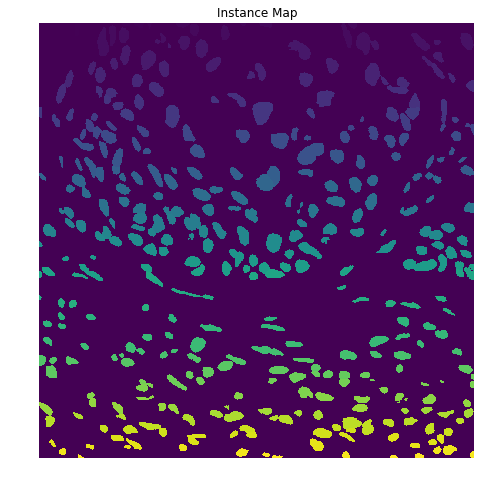

In [9]:
# view contents of a singlegenerated instance map

inst_map_pannuke = np.load(output_list_pannuke[0] + '/instances.npy') # read the first file

# the numpy file is a HxW size array, where H and W are the height and width of the original image. The instance map contains pixels from 0 to N, where 0 is background and N is the number of predicted nuclei

print('Shape:', inst_map_pannuke.shape) # show the shape of the instance map

# Now let's plot the map

plt.figure(figsize=(10,8))

plt.imshow(inst_map_pannuke)
plt.axis('off')
plt.title('Instance Map')
plt.show()

In [10]:
# view contents of the generated instance dictionary

dict_path_pannuke = output_list_pannuke[0] + '/nuclei_dict.json' # path to inst dict of first file

centroid_list = []
contour_list = [] 
type_list = []
probs_list = []

with open(dict_path_pannuke) as json_file:
    data = json.load(json_file)
    for inst in data:
        inst_info = data[inst]
        inst_centroid = inst_info['centroid']
        centroid_list.append(inst_centroid)
        inst_contour = inst_info['contour']
        contour_list.append(inst_contour)
        inst_type = inst_info['type']
        type_list.append(inst_type)
        inst_probs = inst_info['probs']
        probs_list.append(inst_probs)

# get info of the first nucleus
idx = 0
centroid_pannuke = centroid_list[idx]
contour_pannuke = contour_list[idx]
type_pannuke = type_list[idx]
probs_pannuke = probs_list[idx]

print('Centroid Coords:', centroid_pannuke) # centroid will be a float as it is estimated via the average of contour coordinates
print('Contour Coords:', contour_pannuke)
print('Type:', type_pannuke)
print('Type Probs:', probs_pannuke)


Centroid Coords: [66.4, 10.076]
Contour Coords: [[65, 0], [65, 3], [63, 5], [63, 6], [61, 8], [61, 9], [60, 10], [60, 11], [59, 12], [59, 13], [58, 14], [58, 17], [59, 18], [59, 19], [60, 20], [61, 20], [62, 21], [66, 21], [68, 19], [68, 17], [69, 16], [69, 15], [70, 14], [70, 13], [72, 11], [72, 10], [73, 9], [73, 8], [74, 7], [74, 5], [75, 4], [75, 0], [67, 0], [66, 1]]
Type: 3
Type Probs: [0.096, 0.0, 0.0, 0.904, 0.0, 0.0]


### Next Let's process images with a checkpoint trained on the MoNuSAC Challenge dataset

In [11]:
# Next, use MoNuSAC model trained on the MoNuSAC challenge dataset. The PanNuke dataset consists of the following classes:
# 1) Epithelial, 2) Lymphocyte, 3) Macrophage, 4) Neutrophil

args['--input_dir'] = 'tile_input_monusac'      # Directory containing input images
args['--model'] = 'monusac.npz'                 # Path to saved checkpoint.
args['--output_dir'] = 'tile_output_monusac'    # Directory where the output will be saved

In [14]:
infer_monusac = InferTile()
infer_monusac._parse_args(args)
infer_monusac.load_model()
infer_monusac.process_all_files()

Loading Model...
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
Processing Images: 100%|########################| 13/13 [00:59<00:00,  4.33s/it]


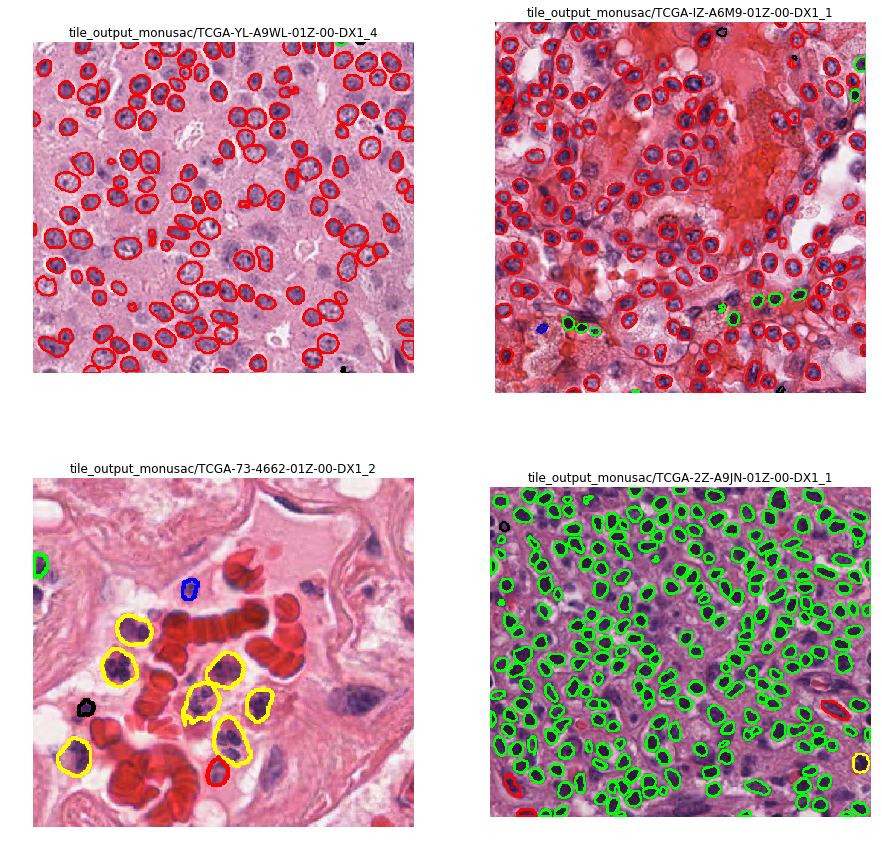

In [21]:
# Visualise the results 

# view overlaid results for a selection of images

output_list_monusac = glob.glob(args['--output_dir']  + '/*') # get a list of the overlaid results in the output directory

im_numbers = [1,5,6,12]
plt.figure(figsize=(15,15))

count = 1
for im_number in im_numbers:
    overlay_monusac = cv2.imread(output_list_monusac[im_number] + '/overlay.png') # read the first file
    overlay_monusac = cv2.cvtColor(overlay_monusac, cv2.COLOR_BGR2RGB) # cv2 reads as BGR -> convert back to RGB
    plt.subplot(2,2,count)
    plt.imshow(overlay_monusac)
    plt.axis('off')
    plt.title(output_list_monusac[im_number])
    count += 1

plt.show()

### MoNuSAC Colour Mapping (Figure Above)

- Red: Epithelial
- Green: Lymphocyte
- Blue: Macrophage
- Yellow: Neutrophil


Shape: (446, 512)


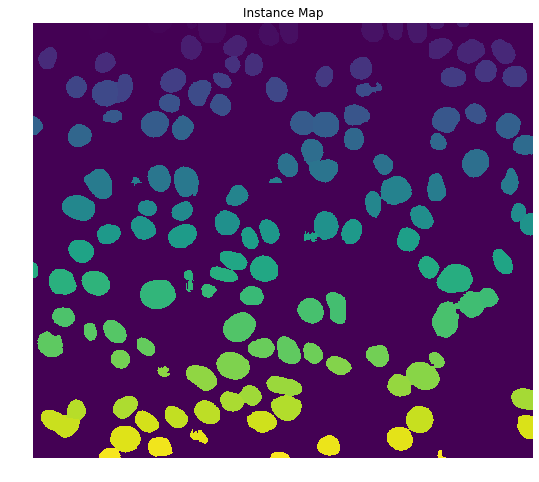

In [23]:
# view contents of the generated instance map

inst_map_monusac = np.load(output_list_monusac[1] + '/instances.npy') # read the first file

# the numpy file is a HxW size array, where H and W are the height and width of the original image. The instance map contains pixels from 0 to N, where 0 is background and N is the number of predicted nuclei

print('Shape:', inst_map_monusac.shape) # show the shape of the instance map

# Now let's plot the map

plt.figure(figsize=(10,8))

plt.imshow(inst_map_monusac)
plt.axis('off')
plt.title('Instance Map')
plt.show()